# Isolation Forest

In [1]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import StandardScaler

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

<div class="alert alert-info" role="alert">
    <h2>Muestra muy poco balanceada</h2>
    Cogiendo una fracción de los datos, los casos de fraude seran muy reducidos 
</div>

In [2]:
def balancedCut(df ,n ,frac = [0.5], target = 'Class',classes=[0,1]):
    print(f'{"="*50}\nbalancedCut\n{"="*50}')
    print(f'Realizando seleccion de la muestra la muestra')
    newDfs = []
    if sum(frac) > 1:
        print(f'Valor de la fraccion incorrecto: --> {sum(frac)} > 1')
        
    if len(frac) < len(classes):
        frac.append(1-sum(frac))
    
    for cl,fc in zip(classes, frac):
        ndf = df[df[target]==cl]
        ro = ndf.shape[0]
        print(f'Dataset de clase --> {cl}')
        if int(fc*n) > ro:
            newDfs.append(ndf)
            print(f'\tFilas: {ro}')
        else:
            newDfs.append(ndf.sample(n=int(fc*n)))
            print(f'\tFilas: {int(fc*n)}')
    
    return pd.concat(newDfs), newDfs[1].shape[0]/newDfs[0].shape[0]

In [3]:
cards = pd.read_csv("/home/vcalzada/Work/proyecto/modelos/creditcard.csv")
cards = cards.sample(frac=1)


cards.head()

df, frac = balancedCut(cards, 30000, frac=[0.9])

balancedCut
Realizando seleccion de la muestra la muestra
Dataset de clase --> 0
	Filas: 27000
Dataset de clase --> 1
	Filas: 492


In [4]:
frac

0.018222222222222223

In [29]:
fig = px.scatter_3d(df, x='V1',y='V2',z='V3', color='Class',opacity=0.85)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [16]:
p,n = confusion_matrix(y, y_pred)
tp,fp,fn,tn = *p,*n


In [17]:
print(tp,fp,fn,tn)

26796 204 195 297


In [9]:
confusion_matrix(y,y_pred)

array([[26796,   204],
       [  195,   297]])

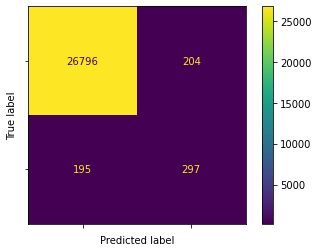

In [5]:
iso = IsolationForest(random_state = 1, contamination= frac)

campos = list(cards.keys())
campos.remove("Class")
X = np.array(df[campos])
y = np.array(df["Class"])
scaler = StandardScaler()
X = scaler.fit_transform(X)
#clf.fit(X)
y_pred = iso.fit_predict(X)
y_pred[y_pred==1]=0
y_pred[y_pred==-1]=1
cm = confusion_matrix(y, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[])
disp.plot()


In [102]:
fig = make_subplots(rows=1, cols=2,
                   specs=[[{'type': 'scene'}, {'type': 'scene'}]])
t = y_pred==0
n = y_pred==1
fig.add_trace(go.Scatter3d(x=X[t,1],y=X[t,2],z=X[t,3], mode='markers', marker=dict(color='blue'), 
                           name='No fraude'), row=1, col=1)
fig.add_trace(go.Scatter3d(x=X[n,1],y=X[n,2],z=X[n,3], mode='markers', marker=dict(color='orange'), 
                           name='Fraude'), row=1, col=1)
t = y==0
n = y==1
fig.add_trace(go.Scatter3d(x=X[t,1],y=X[t,2],z=X[t,3], mode='markers', marker=dict(color='blue'),
                           name = 'No fraude'), row=1, col=2)
fig.add_trace(go.Scatter3d(x=X[n,1],y=X[n,2],z=X[n,3], mode='markers', marker=dict(color='orange'), 
                           name = 'Fraude'), row=1, col=2)
fig.show()

# PCA 

In [103]:
pca = PCA(n_components=3)
pca.fit(X)
X_pca = pca.transform(X)

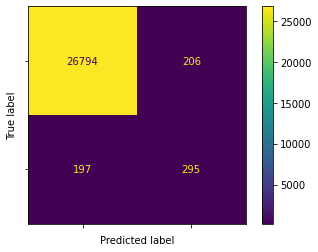

In [104]:
iso = IsolationForest(random_state = 1, contamination= frac)

y_pred_pca = iso.fit_predict(X_pca)
y_pred_pca[y_pred_pca==1]=0
y_pred_pca[y_pred_pca==-1]=1
cm = confusion_matrix(y, y_pred_pca)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[])
disp.plot()

In [107]:
print(classification_report(y,y_pred_pca))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     27000
           1       0.59      0.60      0.59       492

    accuracy                           0.99     27492
   macro avg       0.79      0.80      0.79     27492
weighted avg       0.99      0.99      0.99     27492



In [106]:
fig = make_subplots(rows=1, cols=2,
                   specs=[[{'type': 'scene'}, {'type': 'scene'}]])
t = y_pred_pca==0
n = y_pred_pca==1
fig.add_trace(go.Scatter3d(x=X_pca[t,0],y=X_pca[t,1],z=X_pca[t,2], mode='markers', marker=dict(color='blue'), 
                           name='No fraude'), row=1, col=1)
fig.add_trace(go.Scatter3d(x=X_pca[n,0],y=X_pca[n,1],z=X_pca[n,2], mode='markers', marker=dict(color='orange'), 
                           name='Fraude'), row=1, col=1)
t = y==0
n = y==1
fig.add_trace(go.Scatter3d(x=X_pca[t,0],y=X_pca[t,1],z=X_pca[t,2], mode='markers', marker=dict(color='blue'),
                           name = 'No fraude'), row=1, col=2)
fig.add_trace(go.Scatter3d(x=X_pca[n,0],y=X_pca[n,1],z=X_pca[n,2], mode='markers', marker=dict(color='orange'), 
                           name = 'Fraude'), row=1, col=2)
y_wrong = y-y_pred_pca
t = y_wrong ==-1
n = y_wrong == 1 
fig.add_trace(go.Scatter3d(x=X_pca[t,0],y=X_pca[t,1],z=X_pca[t,2], mode='markers', marker=dict(color='red'),
                           name = 'No fraude mal identificado'), row=1, col=1)
fig.add_trace(go.Scatter3d(x=X_pca[n,0],y=X_pca[n,1],z=X_pca[n,2], mode='markers', marker=dict(color='purple'), 
                           name = 'Fraude mal identificado'), row=1, col=1)


fig.show()